In [1]:
# RESEARCH  : Grad-CAM INFERENCE RESEARCH
# RESEARCHER: PARK HYUNHO
# UPDATED AT: 2024-01-16
# CREATED AT: 2023-11-29

# TO-DO : Guided Grad-cam : https://cumulu-s.tistory.com/41
# TO-DO : grad cam paper research and code implementation https://github.com/jacobgil/pytorch-grad-cam?tab=readme-ov-file

In [2]:
# IMPORT LIBRARY

import torch
import torch.nn as nn

from torchvision import models, transforms

from collections import defaultdict

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from datetime import datetime
from tqdm import tqdm
import os 
import json
import sys
import cv2
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam import GradCAM 

# todo : need to change relevant path for library
sys.path.append('../../')
from random_state import set_seed
sys.path.remove('../../')

set_seed(seed=42)

# Move the model to GPU 
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

local_dir = f'C:/Users/MZC01-HYUNHOPART/Desktop/PROJECT/PAPER/HAM10000/'
model_dir = f'C:/Users/MZC01-HYUNHOPART/Desktop/PROJECT/PAPER/MODEL/FINETUNING/fine_tune_model/'
save_dir  = f'C:/Users/MZC01-HYUNHOPART/Desktop/PROJECT/PAPER/RESULT/'

In [ ]:
# Get label information from original data

label_dir = local_dir + 'HAM10000_label.csv'
label_df = pd.read_csv(label_dir)
num_classes = len(label_df['label'].unique())
label_mapping = {label: idx for idx, label in enumerate(label_df.iloc[:, 1].unique())}
print(f'Label Mapped...')
                 
model_dict = {}

for pretrained_model in tqdm(os.listdir(model_dir)):
    if 'pth' in pretrained_model:
        pretrained_model_path = model_dir + pretrained_model
        pretrained_state_dict = torch.load(pretrained_model_path)
        model_architecture = pretrained_model_path.split('/')[-1].split('_')[0]

        # Instantiate the model
        try:
            # Dynamically load the model class
            model_class = getattr(models, model_architecture)
            model = model_class(weights=None)
            model.fc = nn.Linear(model.fc.in_features, num_classes)
            model.load_state_dict(pretrained_state_dict)
            
            model_dict[pretrained_model] = model

        except Exception as e :
            raise ValueError(f'Please check model architecture name which called "{model_architecture}"')

print(f'MODEL SET...')    
    

In [ ]:
# SAMPLE IMAGE
sample_image_count = 1

# Load an example image for inference and CAM generation
image_path = local_dir + f'images/'
sample_image_lst = [image for image in os.listdir(image_path) if '.jpg' in image][:sample_image_count]

print(f'IMAGE SET....')

In [ ]:
# Get Mean and Std about MAM10000

with open(local_dir + 'HAM10000_MeanStd.json', 'r') as ms_json:
    MeanStd = json.load(ms_json)
    
transform = transforms.Compose([
    transforms.ToTensor()
    , transforms.Resize((224, 224), antialias=True) # ImageNet Trained size
    , transforms.Normalize(mean=MeanStd['Mean'], std=MeanStd['Std'])
])


In [ ]:
%%time

# Plot model result 
# Code modification
# https://github.com/jacobgil/pytorch-grad-cam/blob/master/cam.py#L112

model_result_dic = defaultdict(list)

for pretrained_model_name, pretrained_model in tqdm(model_dict.items()):
    if 'resnet' in pretrained_model_name:
        target_layer = [pretrained_model.layer4]
        pretrained_model.eval()
        pretrained_model.to(device)
        
        # Sample image
        for image in sample_image_lst:
            sample_image = cv2.imread(image_path + image, 1)[:, :, ::-1]
            sample_image = np.float32(sample_image) / 255
            
            # Resize the sample_image to match the expected shape
            sample_image = cv2.resize(sample_image, (224, 224))
            
            # Apply the transformation to the sample image
            input_image = transform(sample_image).unsqueeze(0).to(device)

            # Perform inference
            with torch.no_grad():
                output = pretrained_model(input_image)
                
            # Get the predicted class
            predicted_class = torch.argmax(output).item()

            # Convert predicted class index to label
            predicted_label = next(key for key, value in label_mapping.items() if value == predicted_class)

            # Predicted value
            targets = None
            
            # Construct the CAM object once, and then re-use it on many images:
            with GradCAM(model=pretrained_model, target_layers=target_layer) as cam:
                cam.batch_size = 1 

                # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
                grayscale_cam = cam(input_tensor=input_image, targets=targets)
                grayscale_cam = grayscale_cam[0, :]
                
                visualization = show_cam_on_image(sample_image, grayscale_cam, use_rgb=True)
                #cam_image = cv2.cvtColor(visualization, cv2.COLOR_RGB2BGR)
                
            model_result_dic[pretrained_model_name].append([sample_image, visualization])
print(f'\nDONE...')

In [ ]:
plt.imshow(cam_image)


DONE......


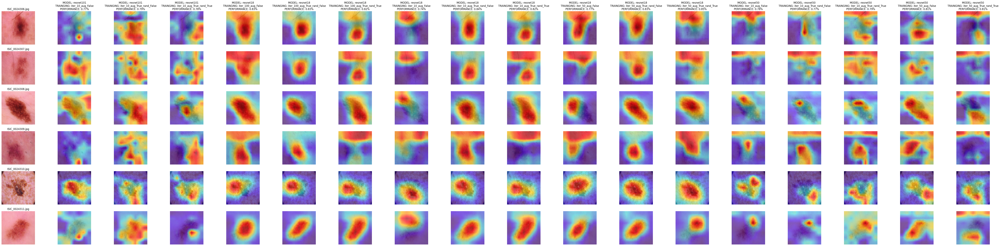

In [158]:
'''
Subplots 
row : Original image and then XAI image
col : Each model result
'''
now = datetime.now().strftime(f'%Y_%m_%d')
fig, ax = plt.subplots(len(sample_image_lst), len(model_result_dic)+1, figsize=(5 * len(model_result_dic), 20))

for col, result in enumerate(model_result_dic):
    ax[0, col+1].set_title(
        f'MODEL: {result.split("_")[0]}\n'
        f'TRAINGING: {"_".join(result.split("_")[1:-2])}\n'
        f'PERFORMANCE: {result.split("_")[-1].replace(".pth", "")}'
        )
    for row in range(len(sample_image_lst)):        
        ax[row, col+1].imshow(model_result_dic[result][row][1])
        ax[row, col+1].axis('off')  # Turn off axis information
            
        if col == len(model_result_dic) -1 :
            ax[row, 0].set_title(sample_image_lst[row])
            ax[row, 0].imshow((model_result_dic[result][row][0]))
            ax[row, 0].axis('off')  # Turn off axis information

plt.savefig(f'{save_dir}model_result_{now}.png')
print(f'SAVED......')        